<a href="https://colab.research.google.com/github/Yashas14/A_Compartive_Analysis_of_Time_Series_Forecasting_For_Energy_Consumption_Using_XGBoost_and_LSTM/blob/main/XGBoost.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
 import pandas as pd
 import numpy as np
 import matplotlib.pyplot as plt
 import seaborn as sns
 import xgboost as xgb
 from sklearn.metrics import mean_squared_error
 color=sns.color_palette()


 plt.style.use('fivethirtyeight')

Data Preparation


In [ ]:
df=pd.read_csv('/content/PJME_hourly.csv')
df=df.set_index('Datetime')
df.index=pd.to_datetime(df.index)

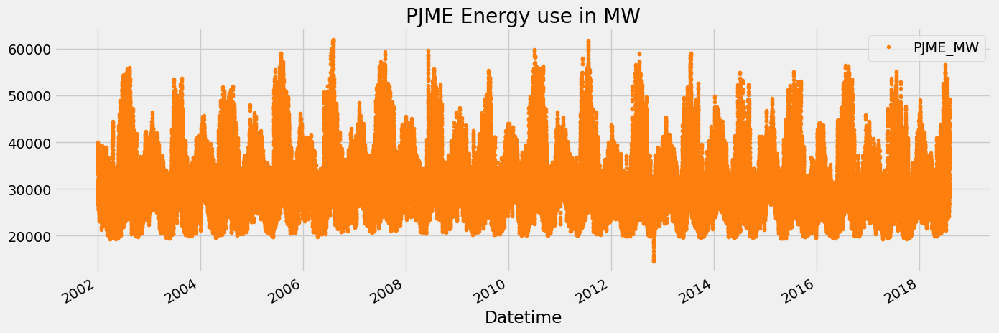

In [ ]:
df.plot(style='.',
          figsize=(15,5),
          color=color[1],
          title='PJME Energy use in MW')
plt.show()

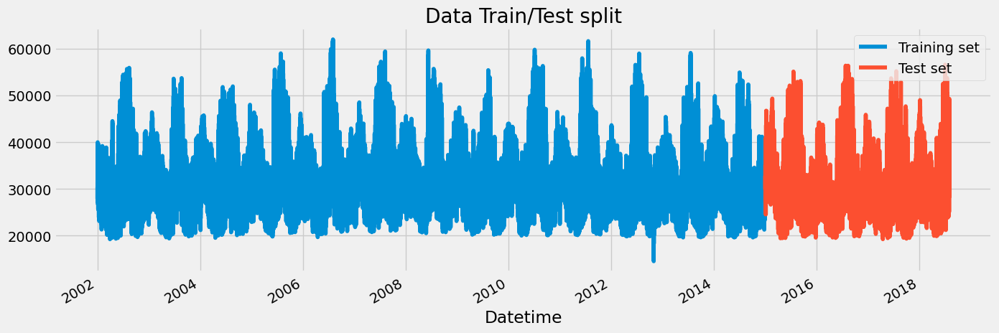

In [ ]:
train=df.loc[df.index < '01-01-2015']
test=df.loc[df.index >= '01-01-2015']

fig,ax=plt.subplots(figsize=(15,5))
train.plot(ax=ax,label='Training set',title='Data Train/Test split')
test.plot(ax=ax,label='Test set')
ax.legend(['Training set','Test set'])
plt.show()

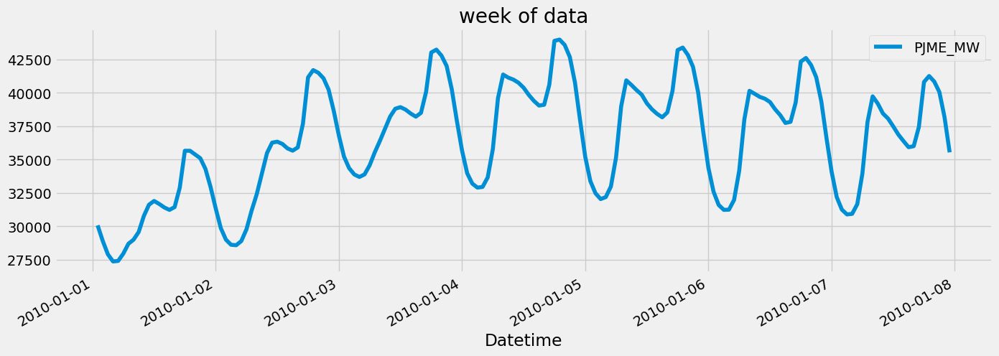

In [ ]:
df.loc[(df.index> '01-01-2010') & (df.index<'01-08-2010')].plot(figsize=(15,5),title='week of data')
plt.show()

Feature creation

In [ ]:
def create_features(df):
  df['hour']=df.index.hour
  df['dayofweek']=df.index.day_of_week
  df['quarter']=df.index.quarter
  df['month']=df.index.month
  df['year']=df.index.year
  df['dayofyear']=df.index.dayofyear
  return df

df=create_features(df)



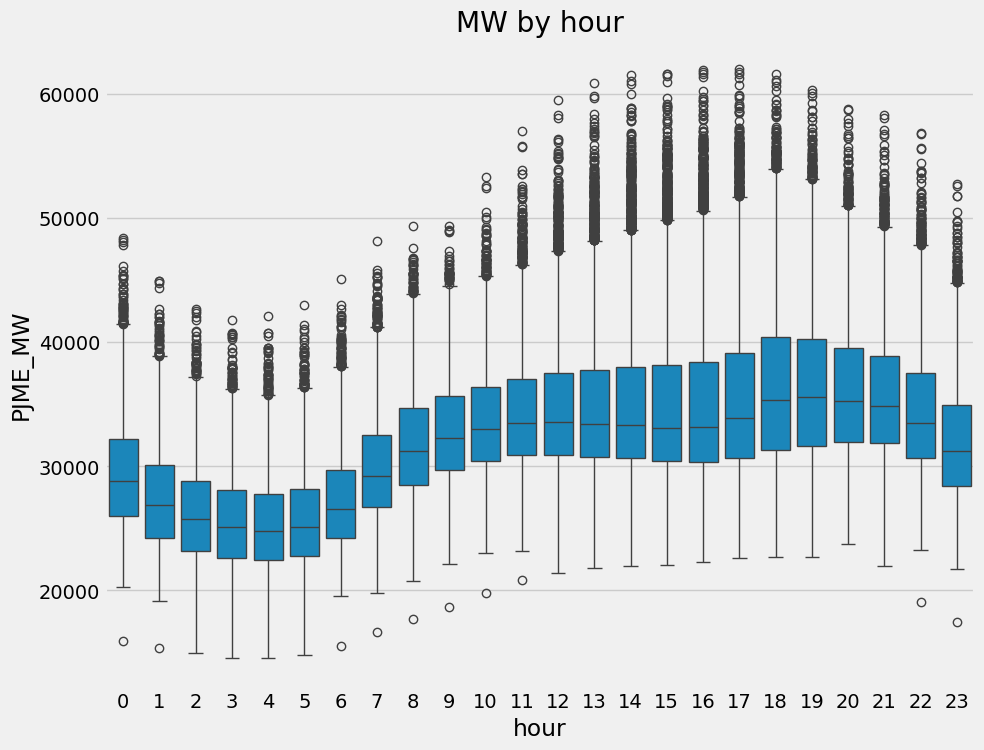

In [ ]:
fig,ax=plt.subplots(figsize=(10,8))
sns.boxplot(data=df,x='hour',y='PJME_MW')
ax.set_title('MW by hour')
plt.show()

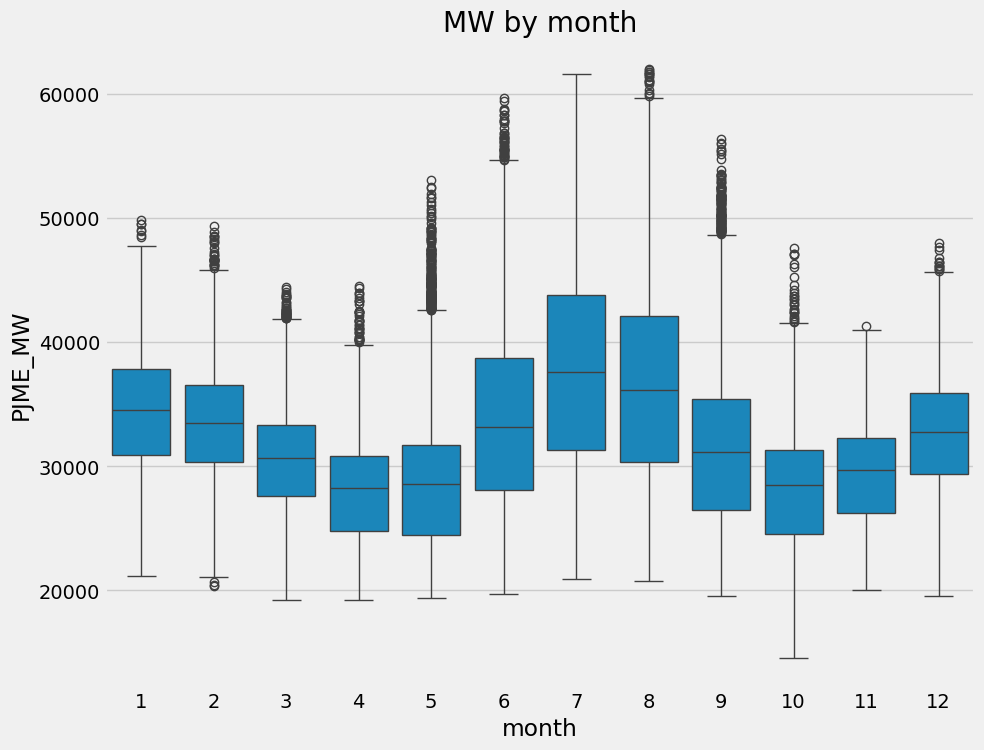

In [ ]:
fig,ax=plt.subplots(figsize=(10,8))
sns.boxplot(data=df,x='month',y='PJME_MW')
ax.set_title('MW by month')
plt.show()

Model


In [ ]:
train=create_features(train)
test=create_features(test)


<ipython-input-6-26815c510a01>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['hour']=df.index.hour
<ipython-input-6-26815c510a01>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['dayofweek']=df.index.day_of_week
<ipython-input-6-26815c510a01>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

In [ ]:
df.columns

Index(['PJME_MW', 'hour', 'dayofweek', 'quarter', 'month', 'year',
       'dayofyear'],
      dtype='object')

In [ ]:
FEATURES=['hour', 'dayofweek', 'quarter', 'month', 'year','dayofyear']
TARGET='PJME_MW'

In [ ]:
X_train=train[FEATURES]
y_train=train[TARGET]

X_test=test[FEATURES]
y_test=test[TARGET]

In [ ]:
reg=xgb.XGBRegressor(n_estimators=1000,early_stopping_rounds=50,learning_rate=0.001)
reg.fit(X_train,y_train,eval_set=[(X_train,y_train),(X_test,y_test)],verbose=True)

[0]	validation_0-rmse:6447.78573	validation_1-rmse:6517.54145
[1]	validation_0-rmse:6443.29274	validation_1-rmse:6513.34687
[2]	validation_0-rmse:6438.80544	validation_1-rmse:6509.15808
[3]	validation_0-rmse:6434.32403	validation_1-rmse:6504.97531
[4]	validation_0-rmse:6429.84843	validation_1-rmse:6500.79842
[5]	validation_0-rmse:6425.37887	validation_1-rmse:6496.62700
[6]	validation_0-rmse:6420.91495	validation_1-rmse:6492.46078
[7]	validation_0-rmse:6416.45698	validation_1-rmse:6488.30113
[8]	validation_0-rmse:6412.00500	validation_1-rmse:6484.14705
[9]	validation_0-rmse:6407.55851	validation_1-rmse:6479.99918
[10]	validation_0-rmse:6403.11804	validation_1-rmse:6475.85686
[11]	validation_0-rmse:6398.68322	validation_1-rmse:6471.72088
[12]	validation_0-rmse:6394.26025	validation_1-rmse:6467.60342
[13]	validation_0-rmse:6389.83693	validation_1-rmse:6463.47982
[14]	validation_0-rmse:6385.41956	validation_1-rmse:6459.36104
[15]	validation_0-rmse:6381.01416	validation_1-rmse:6455.26139
[1

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.001, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

Feature importance

In [ ]:
fi=pd.DataFrame(data=reg.feature_importances_,index=reg.feature_names_in_,columns=['importance'])

In [ ]:
fi

,importance
hour,0.358253
dayofweek,0.163916
quarter,0.012035
month,0.313051
year,0.013602
dayofyear,0.139144


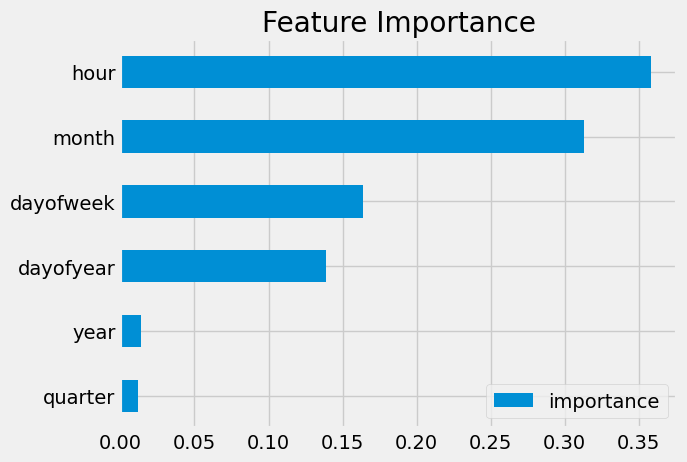

In [ ]:
fi.sort_values('importance').plot(kind='barh',title='Feature Importance')
plt.show()

Forecast on Test

<ipython-input-17-b80b64bfc7e3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['prediction']=reg.predict(X_test)


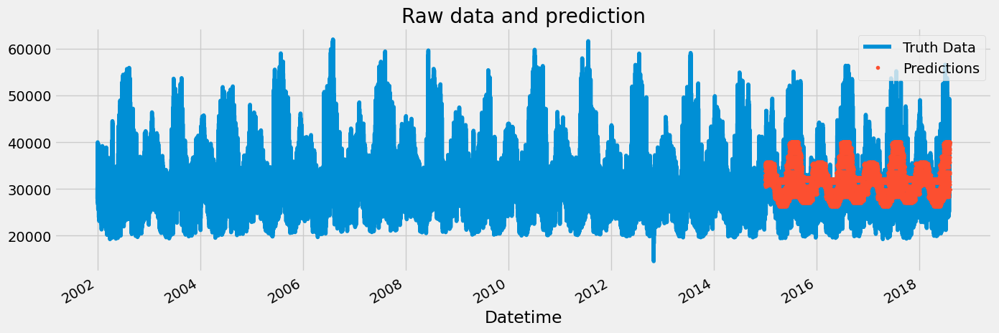

In [ ]:
test['prediction']=reg.predict(X_test)
df=df.merge(test[['prediction']],how='left',left_index=True,right_index=True)
ax=df[['PJME_MW']].plot(figsize=(15,5))
df['prediction'].plot(ax=ax,style='.')
plt.legend(['Truth Data','Predictions'])
ax.set_title('Raw data and prediction')
plt.show()


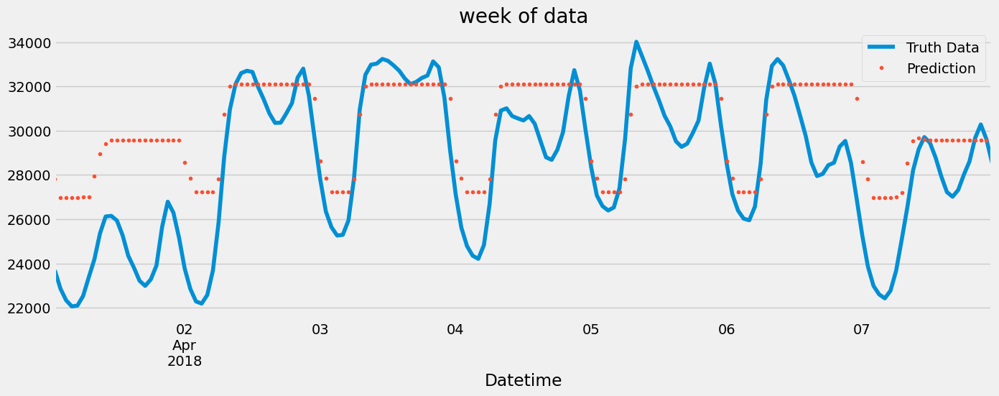

In [ ]:
ax=df.loc[(df.index>'04-01-2018')&(df.index<'04-08-2018')]['PJME_MW'] .plot(figsize=(15,5),title='week of data')
df.loc[(df.index>'04-01-2018')&(df.index<'04-08-2018')]['prediction'] .plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

In [ ]:
score=np.sqrt(mean_squared_error(test['PJME_MW'],test['prediction']))
print(f'RMSE score on test set:{score:0.2f}')

RMSE score on test set:4325.35


Calculating Error

In [ ]:
test['date']=test.index.date

worst case

In [ ]:
test.groupby('date')['error'].mean().sort_values(ascending=False)

KeyError: 'Column not found: error'

In [ ]:
test['error']=np.abs(test[TARGET]-test['prediction'])

Best case


In [ ]:
test.groupby('date')['error'].mean().sort_values(ascending=True).head(5)


,error
date,
2016-12-29,764.857666
2016-12-30,783.728760
2017-11-18,849.959310
2017-03-18,870.751546
2018-04-03,880.189860


In [ ]:
print(test['prediction'])

Datetime
2015-01-01 00:00:00    32089.679688
2015-12-31 01:00:00    29669.609375
2015-12-31 02:00:00    28957.384766
2015-12-31 03:00:00    28957.384766
2015-12-31 04:00:00    28957.384766
                           ...     
2018-01-01 20:00:00    35219.347656
2018-01-01 21:00:00    35219.347656
2018-01-01 22:00:00    35138.976562
2018-01-01 23:00:00    34573.492188
2018-01-02 00:00:00    32089.679688
Name: prediction, Length: 31440, dtype: float32


In [ ]:
test[TARGET]

,PJME_MW
Datetime,
2015-01-01 00:00:00,32802.0
2015-12-31 01:00:00,24305.0
2015-12-31 02:00:00,23156.0
2015-12-31 03:00:00,22514.0
2015-12-31 04:00:00,22330.0
2015-12-31 05:00:00,22773.0
2015-12-31 06:00:00,24106.0
2015-12-31 07:00:00,26129.0
2015-12-31 08:00:00,27660.0


In [ ]:
test['error']

,error
Datetime,
2015-01-01 00:00:00,712.320312
2015-12-31 01:00:00,5364.609375
2015-12-31 02:00:00,5801.384766
2015-12-31 03:00:00,6443.384766
2015-12-31 04:00:00,6627.384766
2015-12-31 05:00:00,6184.384766
2015-12-31 06:00:00,5251.298828
2015-12-31 07:00:00,6252.302734
2015-12-31 08:00:00,5568.058594


In [ ]:
print(test)

                     PJME_MW  hour  dayofweek  quarter  month  year  \
Datetime                                                              
2015-01-01 00:00:00  32802.0     0          3        1      1  2015   
2015-12-31 01:00:00  24305.0     1          3        4     12  2015   
2015-12-31 02:00:00  23156.0     2          3        4     12  2015   
2015-12-31 03:00:00  22514.0     3          3        4     12  2015   
2015-12-31 04:00:00  22330.0     4          3        4     12  2015   
...                      ...   ...        ...      ...    ...   ...   
2018-01-01 20:00:00  44284.0    20          0        1      1  2018   
2018-01-01 21:00:00  43751.0    21          0        1      1  2018   
2018-01-01 22:00:00  42402.0    22          0        1      1  2018   
2018-01-01 23:00:00  40164.0    23          0        1      1  2018   
2018-01-02 00:00:00  38608.0     0          1        1      1  2018   

                     dayofyear    prediction        date        error  
Date

In [ ]:
len((test['prediction']))

31440

In [ ]:
mean=sum(test['error'])/len(test['error'])
mean

3538.944947593631

In [ ]:
mean1=sum(test['prediction'])/len(test['prediction'])
mean1

32311.879644387125

In [ ]:
Error_accuracy=((mean/mean1)*100)
print(Error_accuracy,'%')

10.95245769216146 %


In [ ]:

from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(test[TARGET],test['prediction'])
print("Mean Absolute Error:", mae)

Mean Absolute Error: 3538.944947593631


In [ ]:
Accuracy=100-Error_accuracy
print(Accuracy,'%')

89.04754230783854 %
